In [ ]:
import math
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation

In [7]:
length = 11  # length of pendulum
theta = math.pi / 4  # initial angle (45 degrees)
num_steps = 1000  # number of simulation steps
num_steps_for_animation = 1000
dt = 0.01  # time step
g = 9.81  # gravity

In [8]:
def simulate_pendulum():
    global theta
    coordinates = []

    x = length * math.sin(theta)
    y = -length * math.cos(theta)
    velocity = 0

    for _ in range(num_steps):
        acceleration = -g/length * math.sin(theta)
        velocity += acceleration * dt
        theta += velocity * dt

        x = length * math.sin(theta)
        y = -length * math.cos(theta)
        coordinates.append((x, y))

    return coordinates

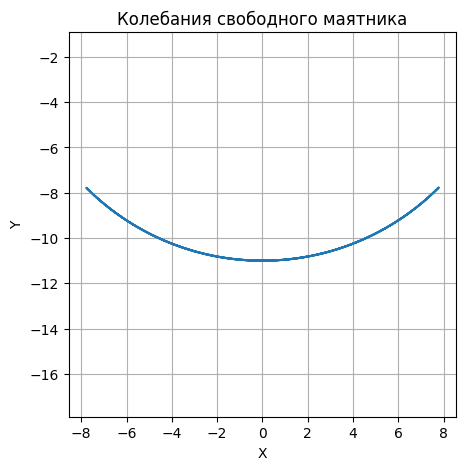

In [9]:
coordinates = simulate_pendulum()
x_values, y_values = zip(*coordinates)


plt.figure(figsize=(5,5))
plt.plot(x_values, y_values)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Колебания свободного маятника')
plt.grid(True)
plt.axis('equal')
plt.show()

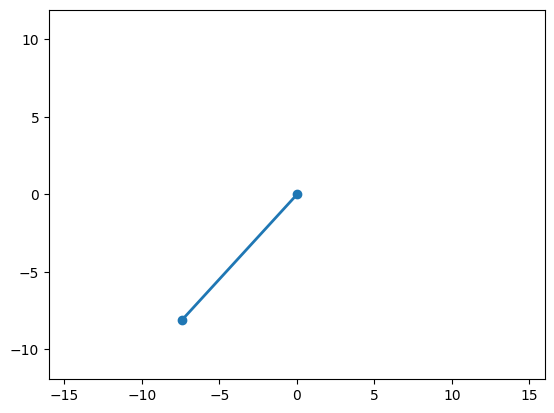

In [10]:
fig, ax = plt.subplots()
plt.axis('equal')
ax.set_xlim(-length-5, length+5)
ax.set_ylim(-length-5, length+5)
line, = ax.plot([], [], 'o-', lw=2)

def init():
    line.set_data([], [])
    return line,

def animate(i):
    x = x_values[i]
    y = y_values[i]
    line.set_data([0, x], [0, y])
    return line,

ani = animation.FuncAnimation(fig, animate, frames=num_steps_for_animation, init_func=init, blit=True)
HTML(ani.to_jshtml())

In [11]:
def get_period():
    peaks = []
    for i in range(1, len(y_values) - 2):
        if y_values[i - 1] < y_values[i] > y_values[i + 1]:
            peaks.append(i)
    return peaks[1] * dt

In [12]:
print("Период свободного колебания: =", get_period())

Период свободного колебания: = 6.9
